In [1]:
import xarray as xr
import numpy as np
from datetime import datetime
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import cartopy.crs as ccrs 
import cartopy.feature as cfeat
from metpy.units import units
import metpy.calc as mpcalc
import cmocean as cmo
from numpy import zeros, newaxis
import shapefile as shp
import geopandas as gpd
import os
import pygrib
import cmocean
import glob
import netCDF4 as nc
import matplotlib.patches as mpatches
from matplotlib.ticker import FixedLocator, FixedFormatter
from matplotlib.colors import ListedColormap,LinearSegmentedColormap

ERROR 1: PROJ: proj_create_from_database: Open of /home/eflicker/.conda/envs/OrionEnv/share/proj failed


In [2]:
means=np.load("Model_PRATE_Monthly_Averages.npy")
obsmeans=np.load("Monthly_Observed_PRATE_flipped_coords.npy")

Calculating Model Composite Averages

In [3]:
# January Composite Average

January=np.zeros([10,181,360])
x=8
for i in range(0,10):
    janu=means[x]
    January[i]=janu
    x=x+12
    
Janmean=np.mean(January, axis=0)
Janstd=np.std(January, axis=0)

In [4]:
# February Composite Average

February=np.zeros([10,181,360])
x=9

for i in range(0,10):
    febu=means[x]
    February[i]=febu
    x=x+12
    
Febmean=np.mean(February, axis=0)
Febstd=np.std(February, axis=0)

In [5]:
# March Composite Average

March=np.zeros([10,181,360])
x=10

for i in range(0,10):
    marchu=means[x]
    March[i]=marchu
    x=x+12
    
Marchmean=np.mean(March, axis=0)
Marchstd=np.std(March, axis=0)

In [6]:
# April Composite Average

April=np.zeros([10,181,360])
x=11

for i in range(0,10):
    apru=means[x]
    April[i]=apru
    x=x+12
    
Aprilmean=np.mean(April, axis=0)
Aprilstd=np.std(April, axis=0)

In [7]:
# May Composite Average

May=np.zeros([10,181,360])
x=0

for i in range(0,10):
    mayu=means[x]
    May[i]=mayu
    x=x+12
    
Maymean=np.mean(May, axis=0)
Maystd=np.std(May, axis=0)

In [8]:
# June Composite Average

June=np.zeros([10,181,360])
x=1

for i in range(0,10):
    junu=means[x]
    June[i]=junu
    x=x+12
    
Junemean=np.mean(June, axis=0)
Junestd=np.std(June, axis=0)

In [9]:
# July Composite Average

July=np.zeros([10,181,360])
x=2

for i in range(0,10):
    julyu=means[x]
    July[i]=julyu
    x=x+12
    
Julymean=np.mean(July, axis=0)
Julystd=np.std(July, axis=0)

In [10]:
# August Composite Average

August=np.zeros([10,181,360])
x=3

for i in range(0,10):
    augu=means[x]
    August[i]=augu
    x=x+12
    
Augustmean=np.mean(August, axis=0)
Augstd=np.std(August, axis=0)

In [11]:
# September Composite Average

September=np.zeros([10,181,360])
x=4

for i in range(0,10):
    sepu=means[x]
    September[i]=sepu
    x=x+12
    
Sepmean=np.mean(September, axis=0)
Sepstd=np.std(September, axis=0)

In [12]:
# October Composite Average

October=np.zeros([10,181,360])
x=5

for i in range(0,10):
    octu=means[x]
    October[i]=octu
    x=x+12
    
Octmean=np.mean(October, axis=0)
Octstd=np.std(October, axis=0)

In [13]:
# November Composite Average

November=np.zeros([10,181,360])
x=6

for i in range(0,10):
    novu=means[x]
    November[i]=novu
    x=x+12
    
Novmean=np.mean(November, axis=0)
Novstd=np.std(November, axis=0)

In [14]:
# December Composite Average

December=np.zeros([10,181,360])
x=7

for i in range(0,10):
    decu=means[x]
    December[i]=decu
    x=x+12
    
Decmean=np.mean(December, axis=0)
Decstd=np.std(December, axis=0)

In [15]:
# Pulling Longitude, latitude and landmask from the model data
file2=xr.open_dataset('/home/eflicker/work2/noaa/gsd-fv3-dev/eflicker/sfs_data/o2/gfs.20150501/gfs.t00z.flux.1p00.f0024', engine='cfgrib',
                       backend_kwargs={'filter_by_keys':{'stepType':'instant','typeOfLevel':'surface'}})
#file3=file2.isel(latitude=slice(None, None, -1))
#lsm=file3['lsm']
lsm2=file2['lsm']
lon=lsm2.metpy.longitude
lat=lsm2.metpy.latitude

/tmp/ipykernel_307505/2528120278.py:6: UserWarning: More than one time coordinate present for variable  "lsm".
  lon=lsm2.metpy.longitude


In [16]:
# Creating my PRATE Colormap

def create_custom_colormap(colors, positions=None):
    if positions is None:
        positions = np.linspace(0, 1, len(colors))
    return LinearSegmentedColormap.from_list("", list(zip(positions, colors)))

colors = ['#FFFFFF','#0000FF','#00FFFF','#008000', '#15B01A', '#FFFF00','#FFA500','#E50000','#8C000F'] 
custom_colormap = create_custom_colormap(colors)

f
f


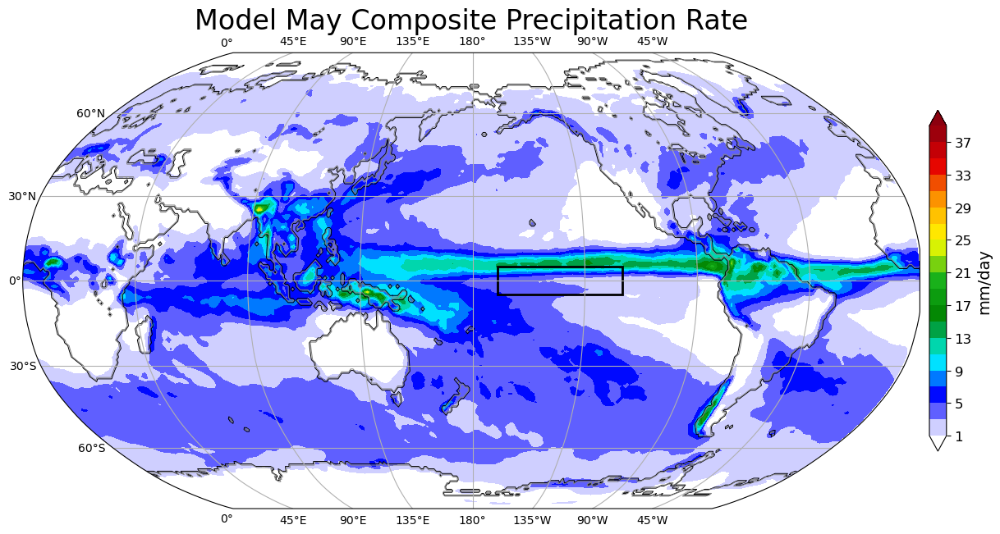

f
f


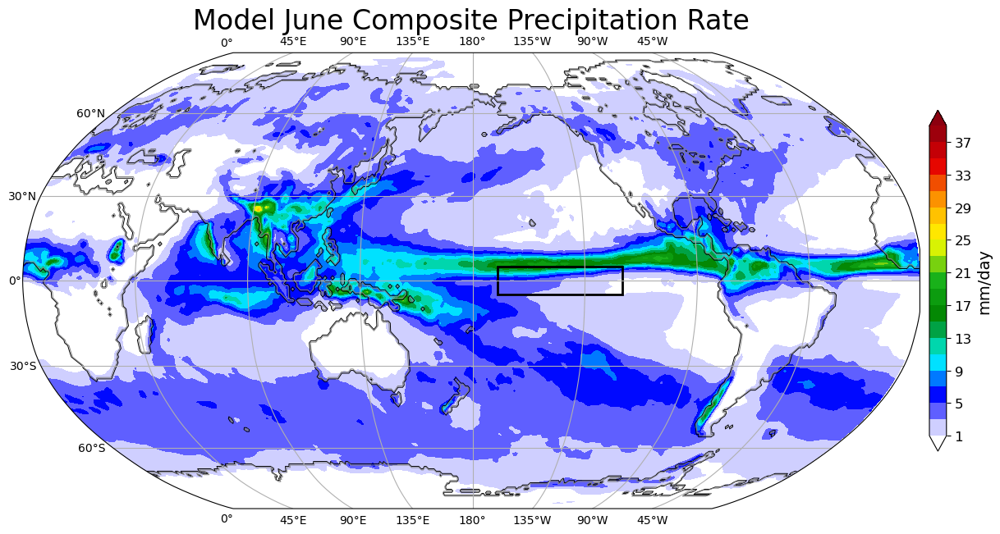

f
f


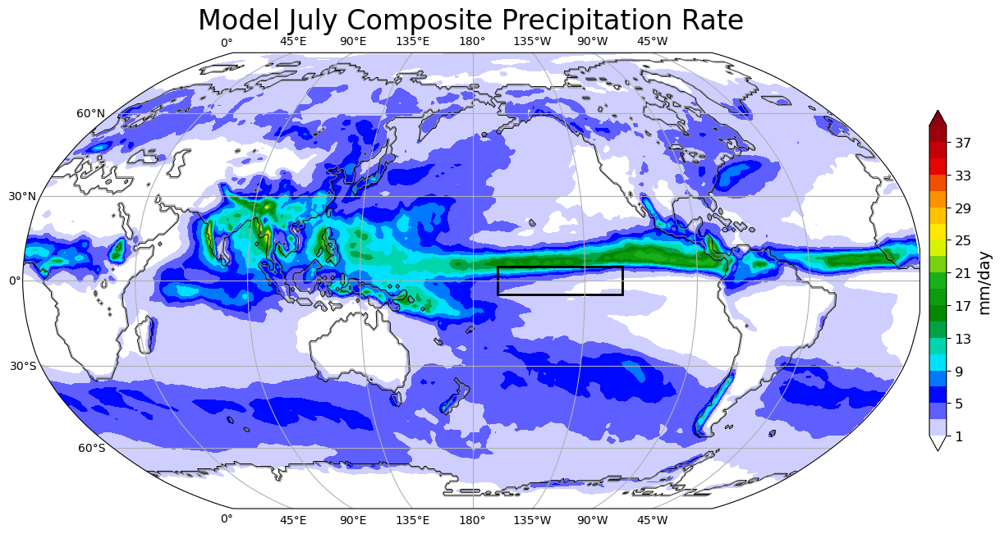

f
f


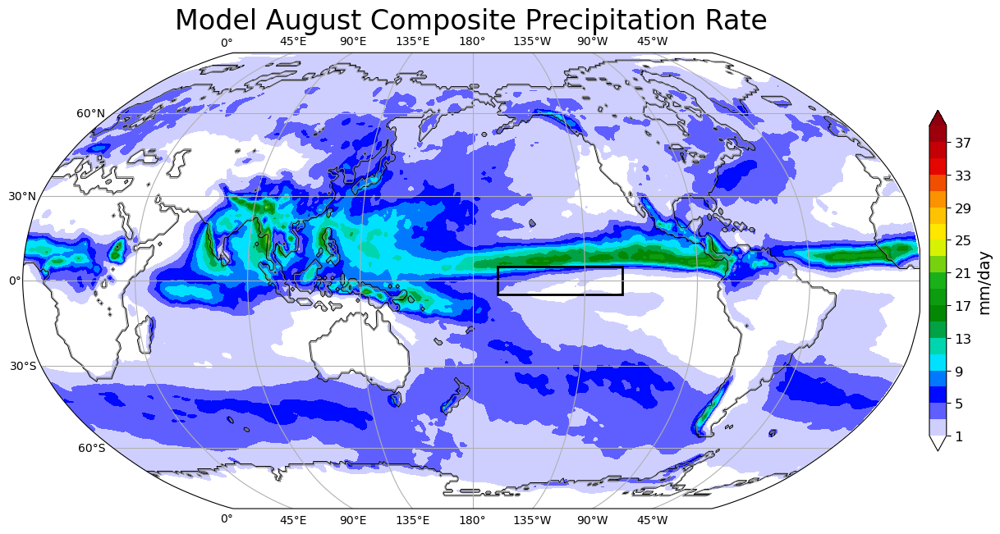

f
f


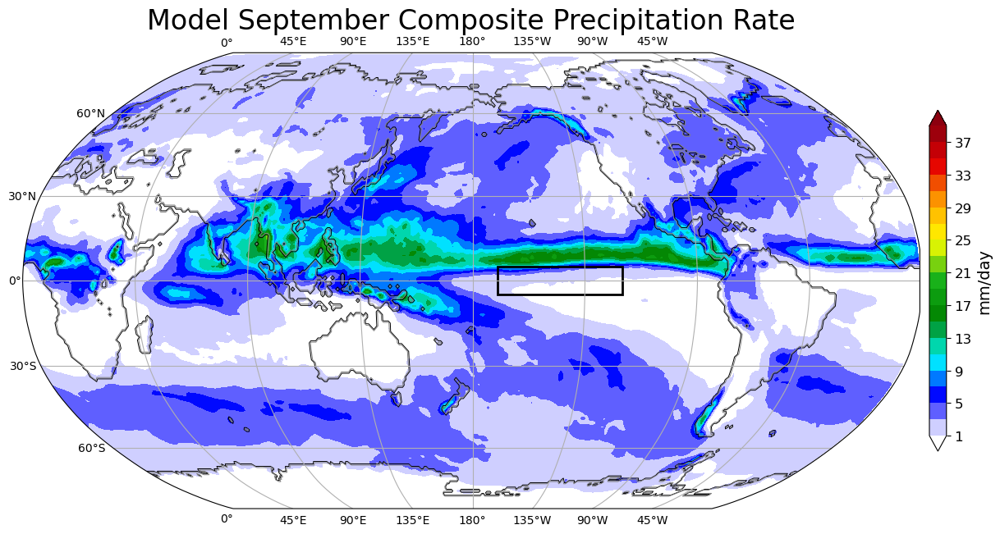

f
f


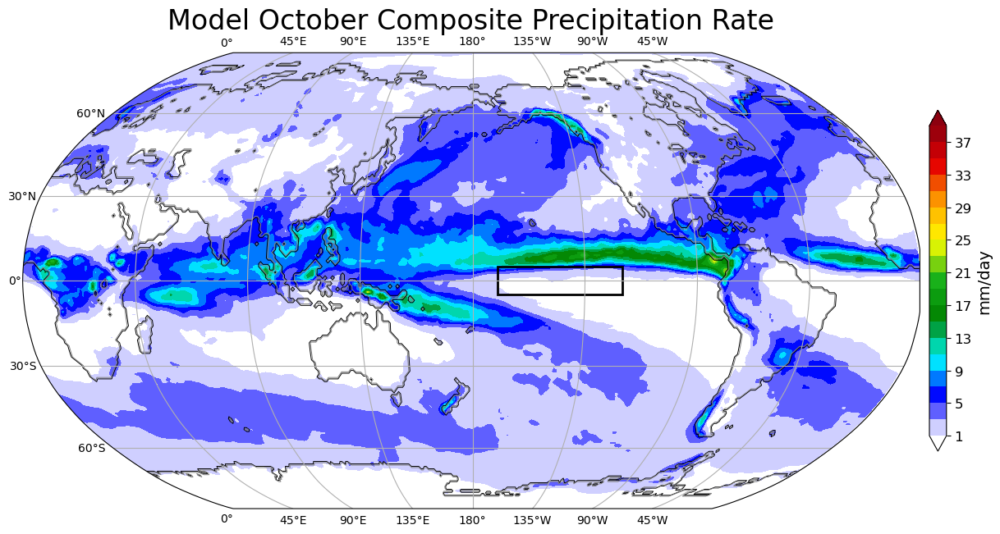

f
f


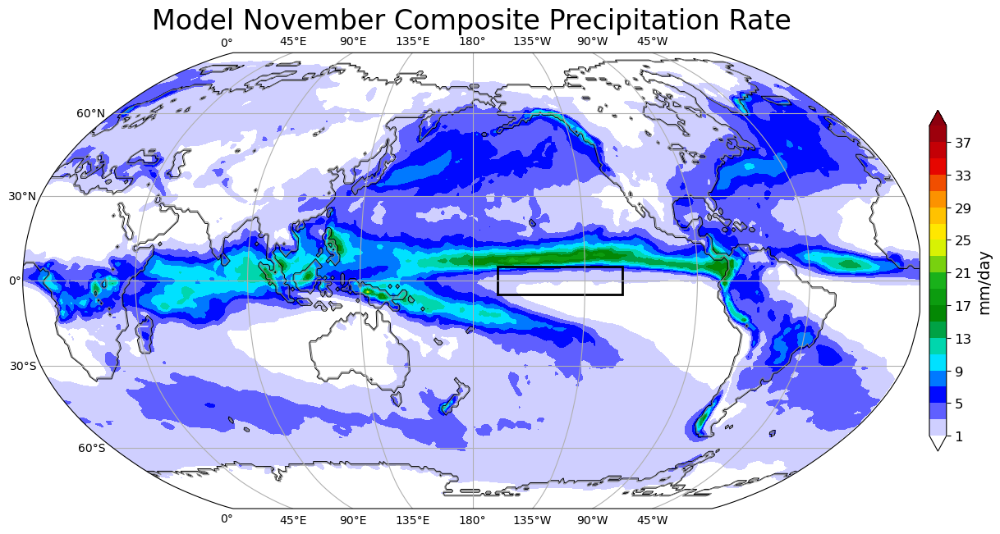

f
f


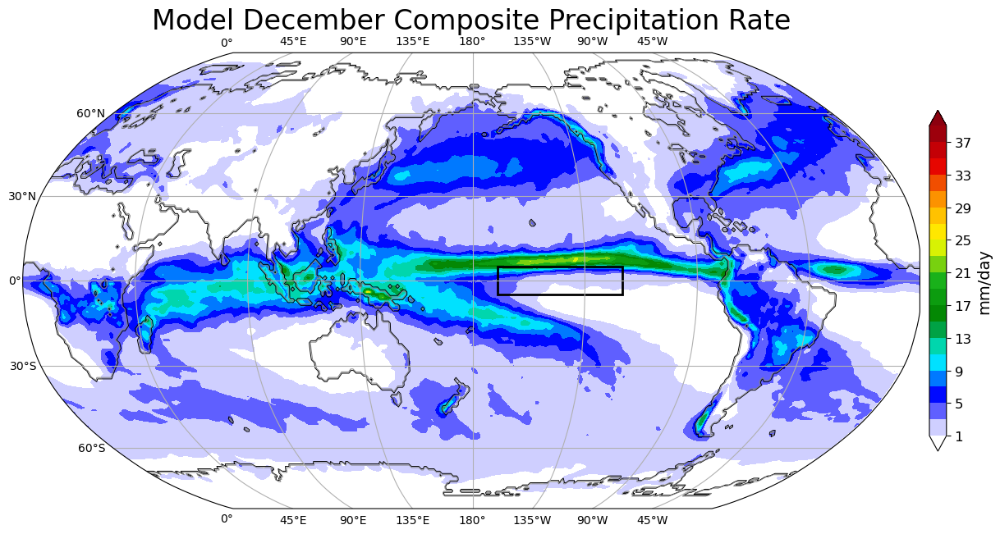

f
f


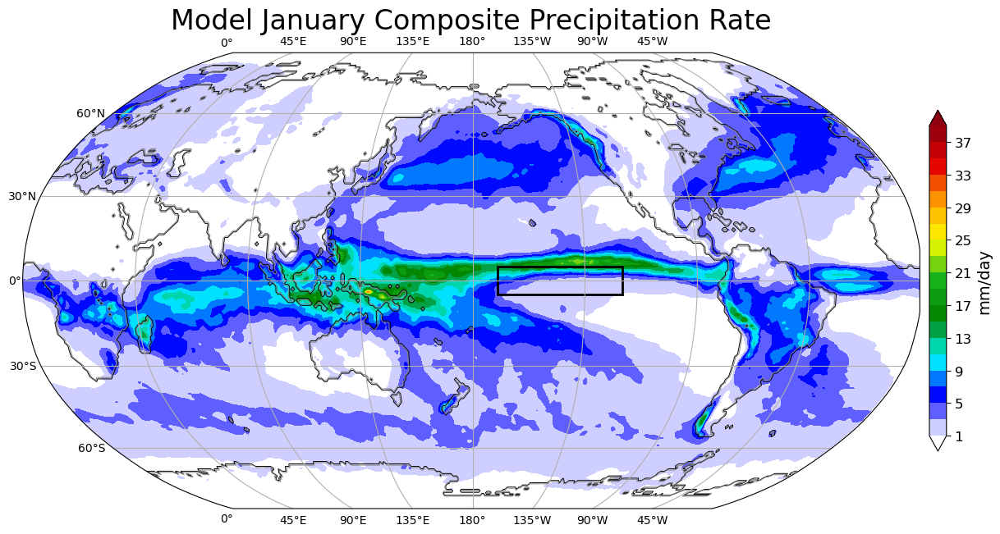

f
f


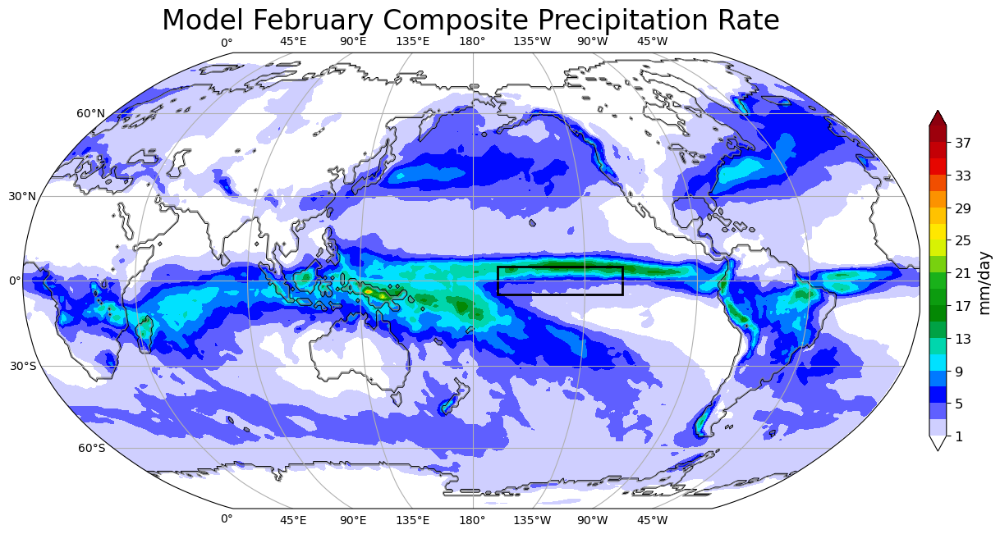

f
f


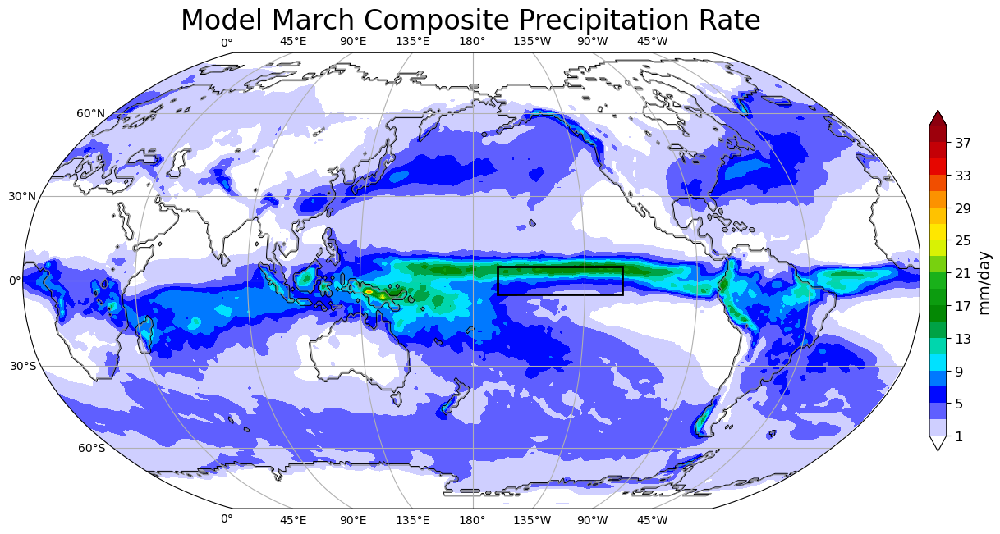

f
f


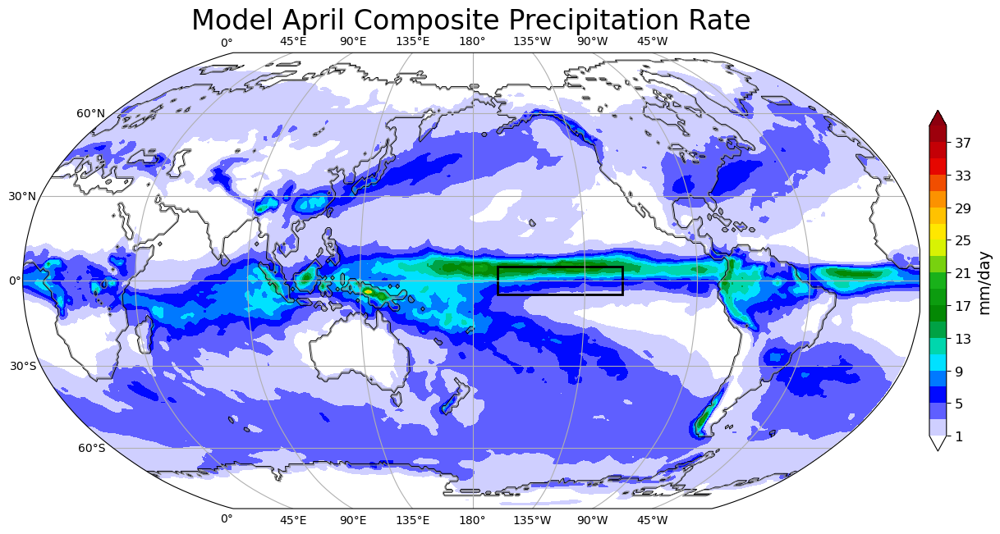

In [17]:
mo_means=[Maymean,Junemean,Julymean,Augustmean,Sepmean,Octmean,Novmean,Decmean,Janmean,Febmean, Marchmean,Aprilmean, ]
months=['May','June','July','August','September','October','November','December','January', 'February','March','April']
for i in range(0,12):
    
    actualmean=mo_means[i]
    
    res='110m'
    fig=plt.figure(figsize=(15,9))
    ax = plt.subplot(1, 1, 1, projection=ccrs.Robinson(central_longitude=180))
    #ax.set_extent([100, 290, -60, 60], crs=ccrs.PlateCarree())
    #ax.add_feature(cfeat.COASTLINE.with_scale(res))

    # Plot a contour-filled variable
    print('f')
    CG=ax.contourf(lon,lat,actualmean,levels=np.arange(1,41,2), cmap=custom_colormap,extend='both', transform=ccrs.PlateCarree())
    CF=ax.contour(lon,lat,lsm2,levels=np.arange(0.25,1.5,0.5), cmap='gist_gray', transform=ccrs.PlateCarree(), linewidths=0.7)
    print('f')
    cbar=plt.colorbar(CG,fraction=0.05, pad=0.01,shrink=0.6)
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.set_ylabel("mm/day", fontsize=14)
    ax.add_patch(mpatches.Rectangle(xy=[190, -5], width=50, height=10,
                                facecolor='none', edgecolor='k', linewidth=2,
                                transform=ccrs.PlateCarree()))
    ax.gridlines(draw_labels=True, xlocs=np.arange(-180,180,45))


    # Title
    title=ax.set_title("Model " + str(months[i])+ " Composite Precipitation Rate",fontsize=24)
    picfile="Model_Composite_PRATE/" +str(months[i]) + ' Composite Average PRATE' + '.png'
    plt.savefig(picfile, format='png')
    plt.show()



Calculating Observed Composite Averages

In [19]:
# January Composite Average

January=np.zeros([10,181,360])
x=0

for i in range(0,10):
    janu=obsmeans[x]
    January[i]=janu
    x=x+12
    #print(x)
    
Janmean2=np.mean(January, axis=0)
Janstd2=np.std(January, axis=0)

In [20]:
# February Composite Average

February=np.zeros([10,181,360])
x=1

for i in range(0,10):
    febu=obsmeans[x]
    February[i]=febu
    x=x+12
    #print(x)
    
Febmean2=np.mean(February, axis=0)
Febstd2=np.std(February, axis=0)

In [21]:
# March Composite Average

March=np.zeros([10,181,360])
x=2

for i in range(0,10):
    marchu=obsmeans[x]
    March[i]=marchu
    x=x+12
    #print(x)
    
Marchmean2=np.mean(March, axis=0)
Marchstd2=np.std(March, axis=0)

In [22]:
# April Composite Average

April=np.zeros([10,181,360])
x=3

for i in range(0,10):
    apru=obsmeans[x]
    April[i]=apru
    x=x+12
    #print(x)
    
Aprilmean2=np.mean(April, axis=0)
Aprilstd2=np.std(April, axis=0)

In [23]:
# May Composite Average

May=np.zeros([10,181,360])
x=4

for i in range(0,10):
    mayu=obsmeans[x]
    May[i]=mayu
    x=x+12
    #print(x)
    
Maymean2=np.mean(May, axis=0)
Maystd2=np.std(May, axis=0)

In [24]:
# June Composite Average

June=np.zeros([10,181,360])
x=5

for i in range(0,10):
    junu=obsmeans[x]
    June[i]=junu
    x=x+12
    #print(x)
    
Junemean2=np.mean(June, axis=0)
Junestd2=np.std(June, axis=0)

In [25]:
# July Composite Average

July=np.zeros([10,181,360])
x=6

for i in range(0,10):
    julyu=obsmeans[x]
    July[i]=julyu
    x=x+12
    #print(x)
    
Julymean2=np.mean(July, axis=0)
Julystd2=np.std(July, axis=0)

In [26]:
# August Composite Average

August=np.zeros([10,181,360])
x=7

for i in range(0,10):
    augu=obsmeans[x]
    August[i]=augu
    x=x+12
    #print(x)
    
Augustmean2=np.mean(August, axis=0)
Augstd2=np.std(August, axis=0)

In [27]:
# September Composite Average

September=np.zeros([10,181,360])
x=8

for i in range(0,10):
    sepu=obsmeans[x]
    September[i]=sepu
    x=x+12
    #print(x)
    
Sepmean2=np.mean(September, axis=0)
Sepstd2=np.std(September, axis=0)

In [28]:
# October Composite Average

October=np.zeros([10,181,360])
x=9

for i in range(0,10):
    octu=obsmeans[x]
    October[i]=octu
    x=x+12
    #print(x)
    
Octmean2=np.mean(October, axis=0)
Octstd2=np.std(October, axis=0)

In [29]:
# November Composite Average

November=np.zeros([10,181,360])
x=10

for i in range(0,10):
    novu=obsmeans[x]
    November[i]=novu
    x=x+12
    #print(x)
    
Novmean2=np.mean(November, axis=0)
Novstd2=np.std(November, axis=0)

In [30]:
# December Composite Average

December=np.zeros([10,181,360])
x=11

for i in range(0,10):
    decu=obsmeans[x]
    December[i]=decu
    x=x+12
    #print(x)
    
Decmean2=np.mean(December, axis=0)
Decstd2=np.std(December, axis=0)

In [31]:
file=xr.open_dataset('/home/eflicker/work2/noaa/gsd-fv3-dev/eflicker/GPCPDAY_2010_2020_1x1.nc')
prate=file['precip']

filea=file.isel(lat=slice(None, None, -1))
prate2=filea['precip']

lon=prate2.metpy.longitude
lat=prate2.metpy.latitude
cmap=cmocean.cm.balance

# Set plot projection information

proj_data=ccrs.LambertConformal(central_longitude=100, central_latitude=38, standard_parallels=[30,45])

f
f


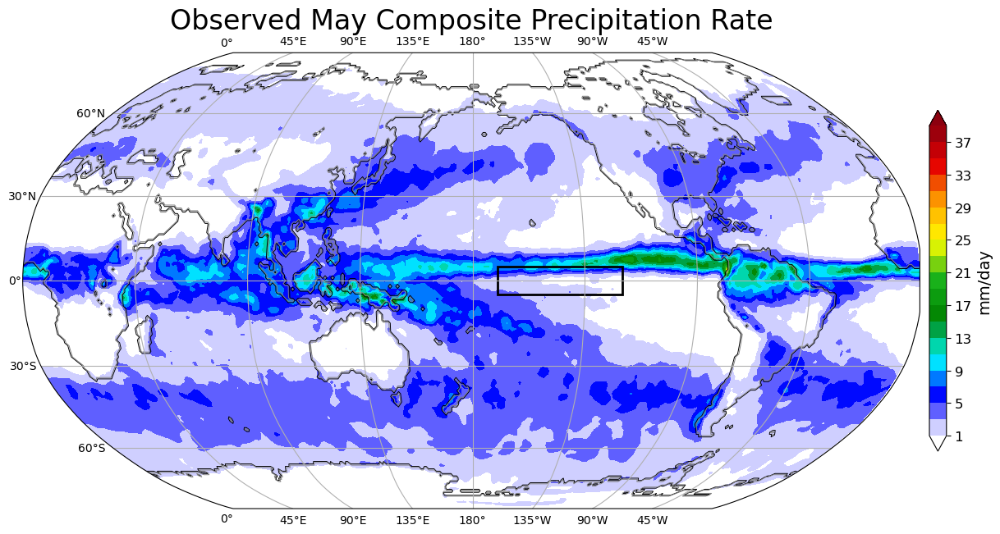

f
f


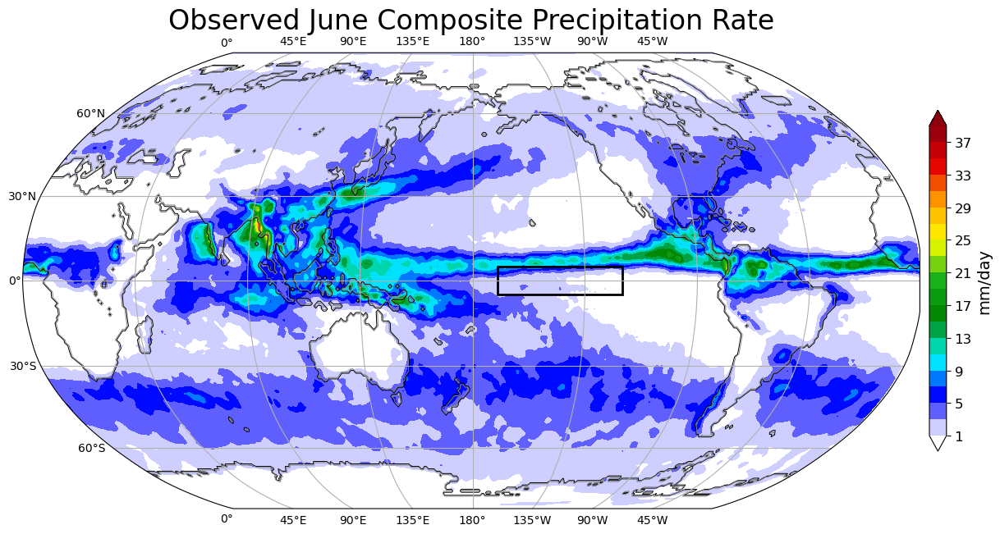

f
f


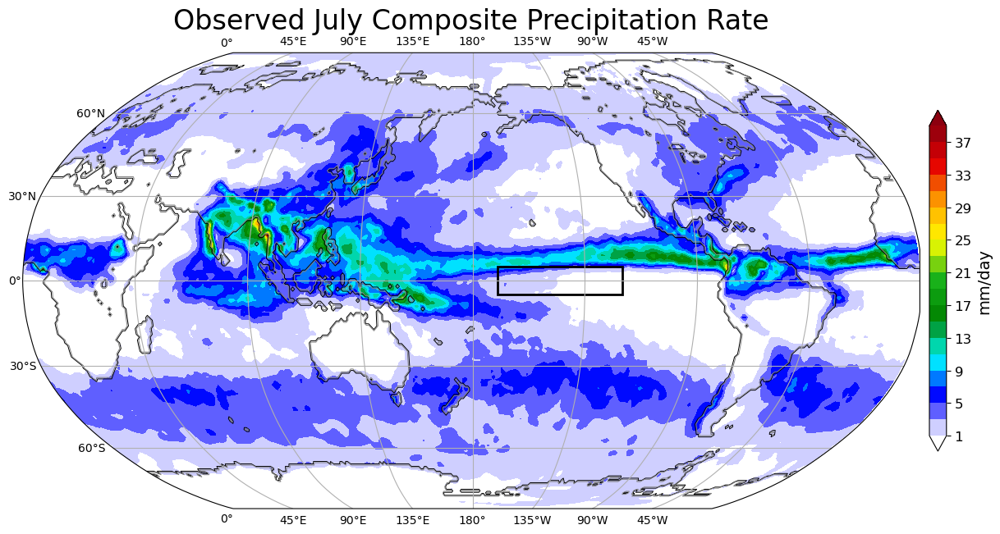

f
f


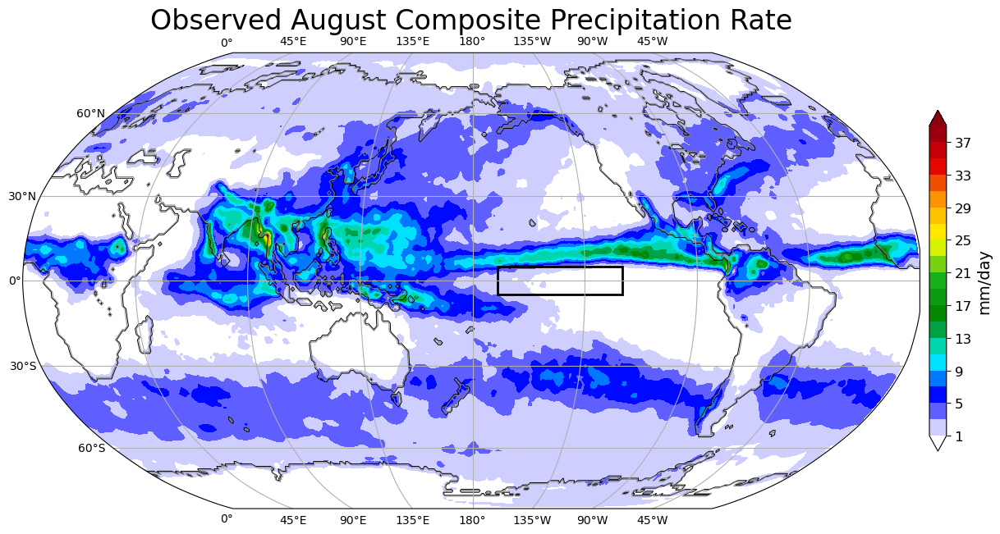

f
f


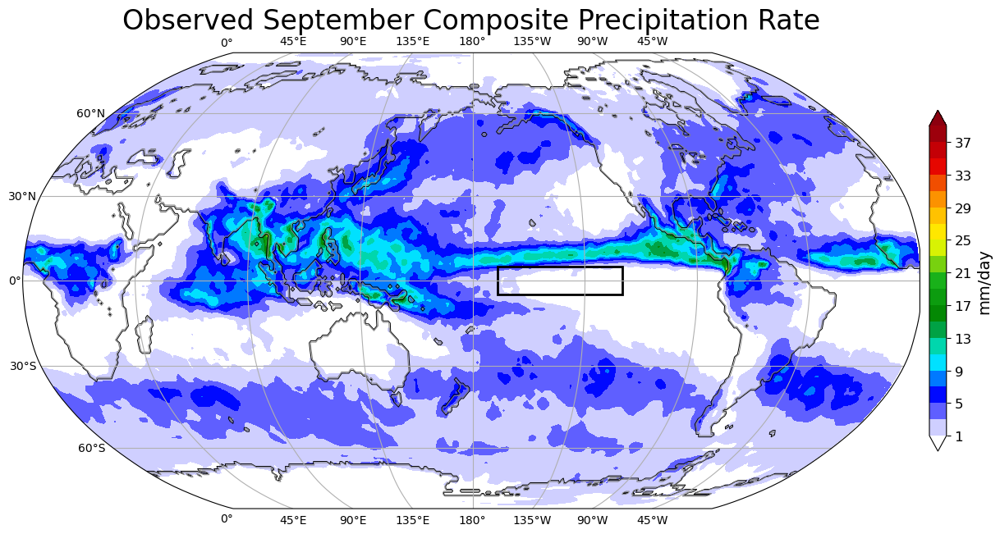

f
f


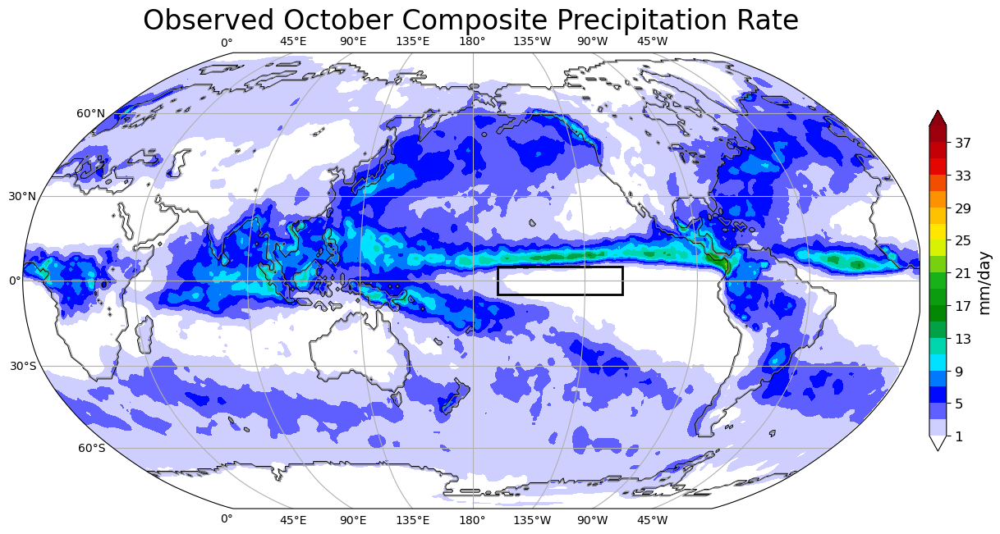

f
f


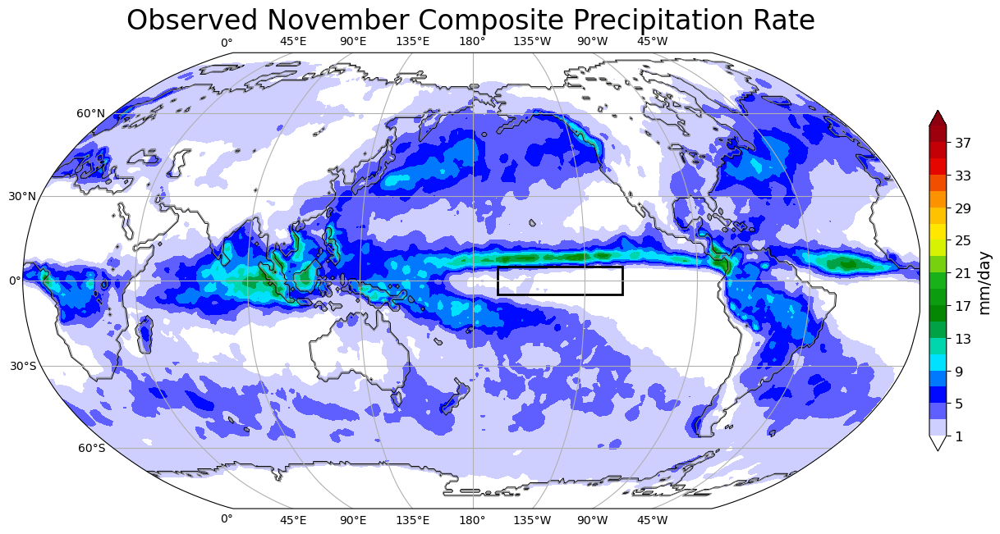

f
f


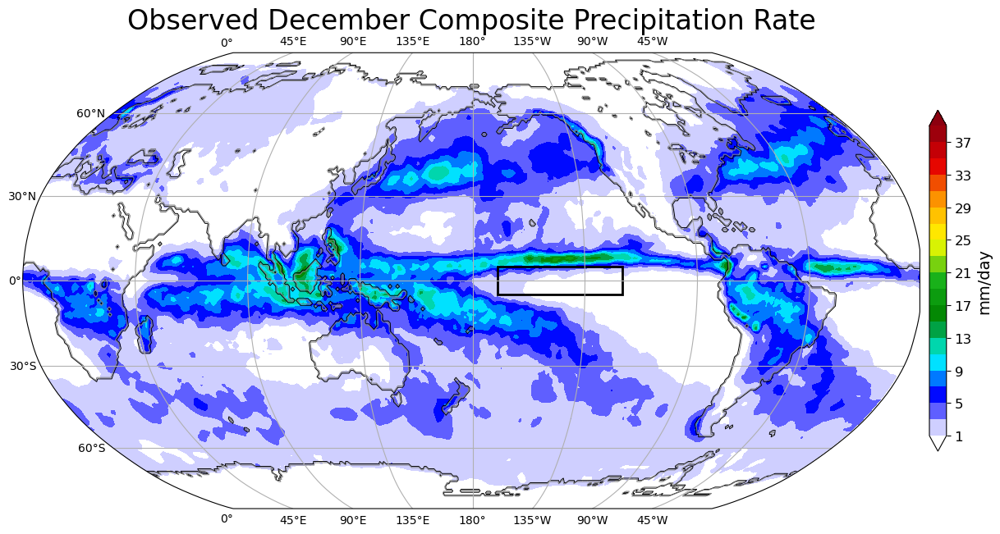

f
f


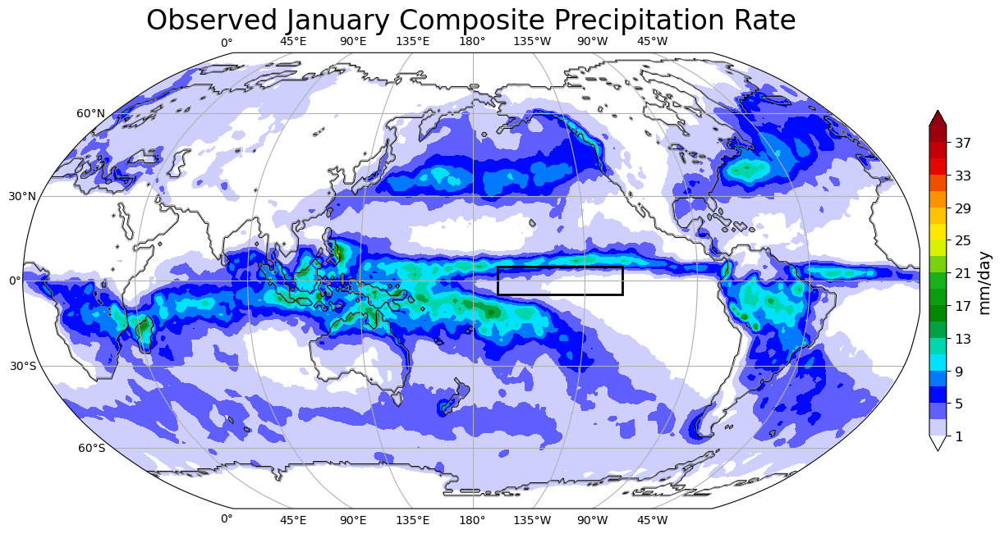

f
f


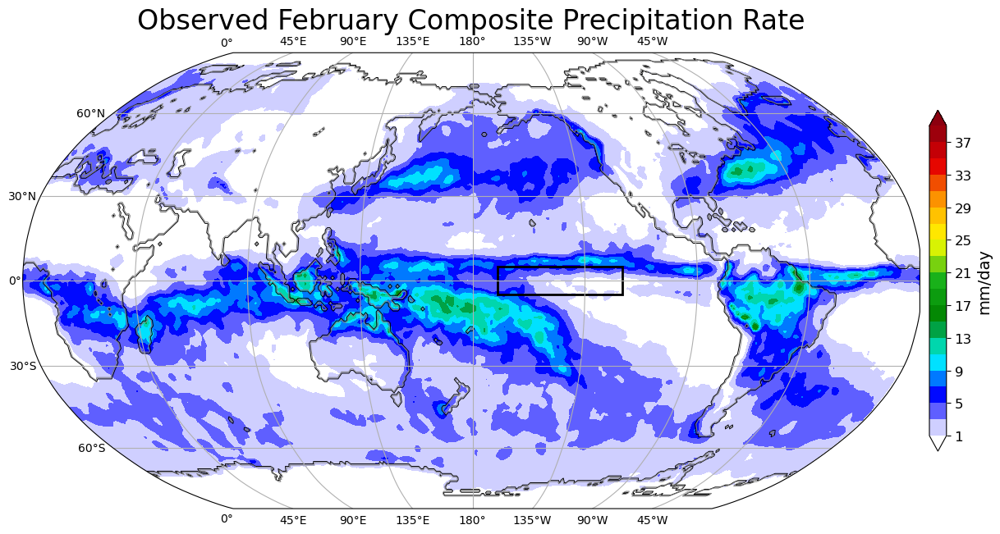

f
f


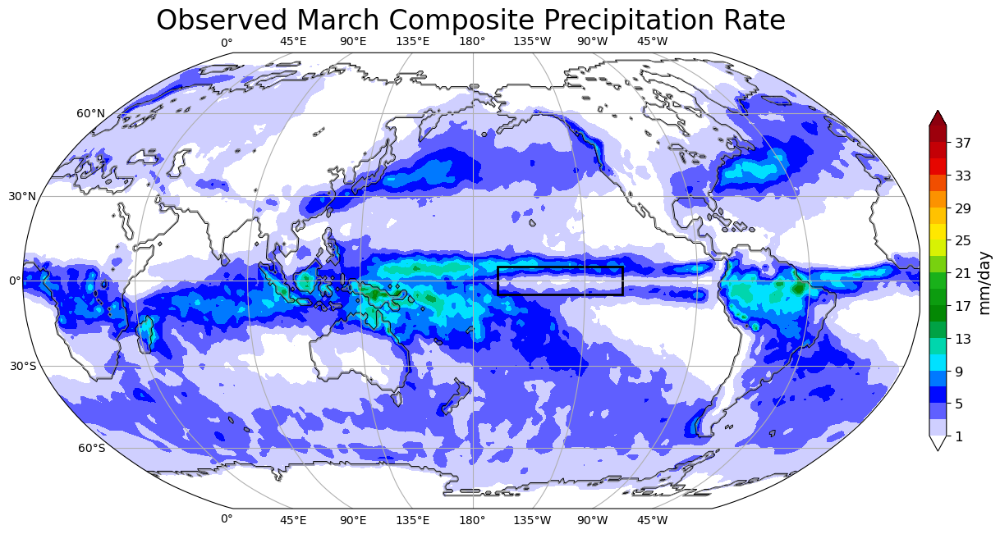

f
f


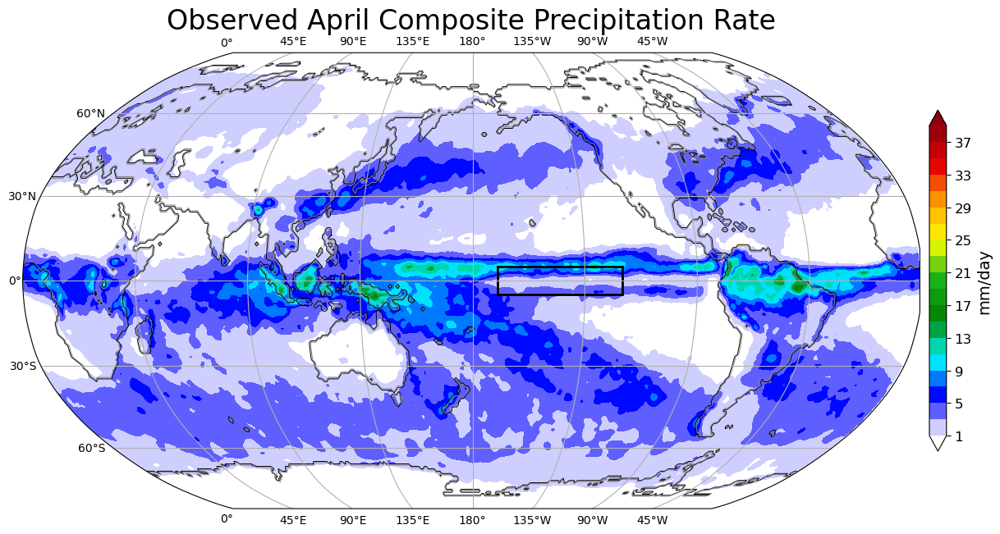

In [32]:
mo_means=[Maymean2,Junemean2,Julymean2,Augustmean2,Sepmean2,Octmean2,Novmean2,Decmean2,Janmean2,Febmean2, Marchmean2,Aprilmean2, ]
months=['May','June','July','August','September','October','November','December','January', 'February','March','April']
for i in range(0,12):
    
    actualmean=mo_means[i]
    
    res='110m'
    fig=plt.figure(figsize=(15,9))
    ax = plt.subplot(1, 1, 1, projection=ccrs.Robinson(central_longitude=180))
    #ax.set_extent([100, 290, -60, 60], crs=ccrs.PlateCarree())
    #ax.add_feature(cfeat.COASTLINE.with_scale(res))

    # Plot a contour-filled variable
    print('f')
    CG=ax.contourf(lon,lat,actualmean,levels=np.arange(1,41,2), cmap=custom_colormap,extend='both', transform=ccrs.PlateCarree())
    CF=ax.contour(lon,lat,lsm2,levels=np.arange(0.25,1.5,0.5), cmap='gist_gray', transform=ccrs.PlateCarree(), linewidths=0.7)
    print('f')
    cbar=plt.colorbar(CG,fraction=0.05, pad=0.01,shrink=0.6)
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.set_ylabel("mm/day", fontsize=14)
    ax.add_patch(mpatches.Rectangle(xy=[190, -5], width=50, height=10,
                                facecolor='none', edgecolor='k', linewidth=2,
                                transform=ccrs.PlateCarree()))
    ax.gridlines(draw_labels=True, xlocs=np.arange(-180,180,45))


    # Title
    title=ax.set_title("Observed " + str(months[i])+ " Composite Precipitation Rate",fontsize=24)
    # plt.savefig("Surface Temp.png", format='png')
    picfile="Observed_Composite_PRATE/"+str(months[i]) + ' Composite Average PRATE' + '.png'
    plt.savefig(picfile, format='png')
    plt.show()



In [34]:
# Composite PRATE Differences 

Jdiff=Janmean-Janmean2
Fdiff=Febmean-Febmean2
Mardiff=Marchmean-Marchmean2
Adiff=Aprilmean-Aprilmean2
Maydiff=Maymean-Maymean2
Jundiff=Junemean-Junemean2
Juldiff=Julymean-Julymean2
Augdiff=Augustmean-Augustmean2
Sdiff=Sepmean-Sepmean2
Odiff=Octmean-Octmean2
Ndiff=Novmean-Novmean2
Ddiff=Decmean-Decmean2

Jstdiff=Janstd-Janstd2
Fstdiff=Febstd-Febstd2
Marstdiff=Marchstd-Marchstd2
Astdiff=Aprilstd-Aprilstd2
Maystdiff=Maystd-Maystd2
Junstdiff=Junestd-Junestd2
Julstdiff=Julystd-Julystd2
Augstdiff=Augstd-Augstd2
Sstdiff=Sepstd-Sepstd2
Ostdiff=Octstd-Octstd2
Nstdiff=Novstd-Novstd2
Dstdiff=Decstd-Decstd2

f
f


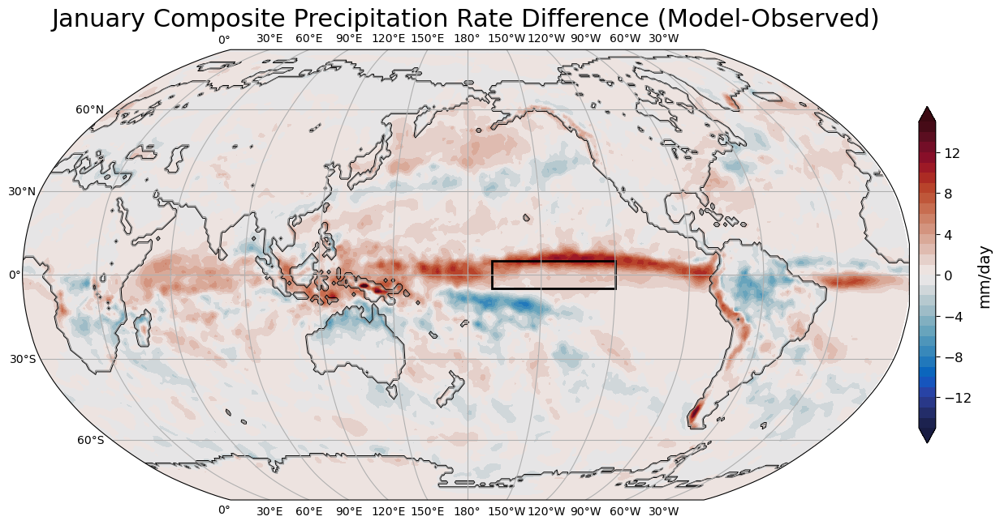

f
f


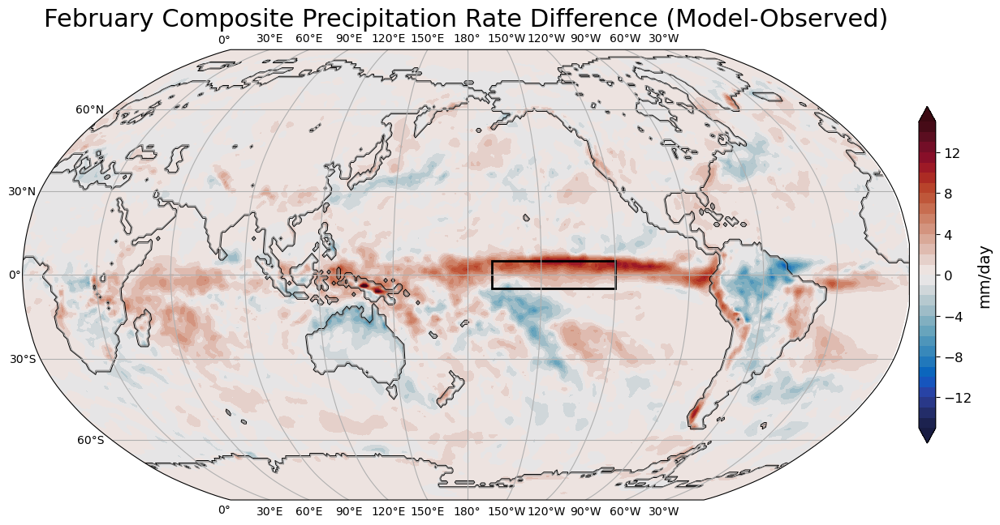

f
f


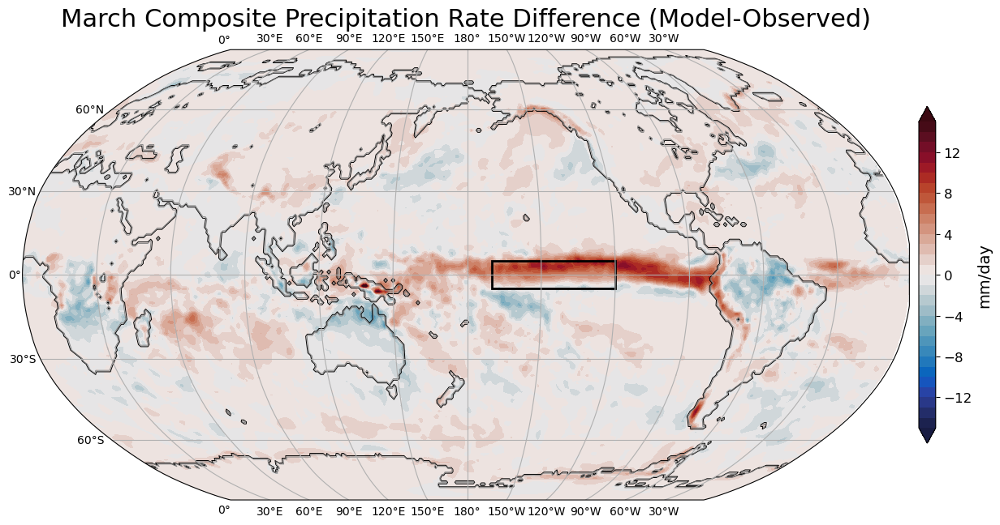

f
f


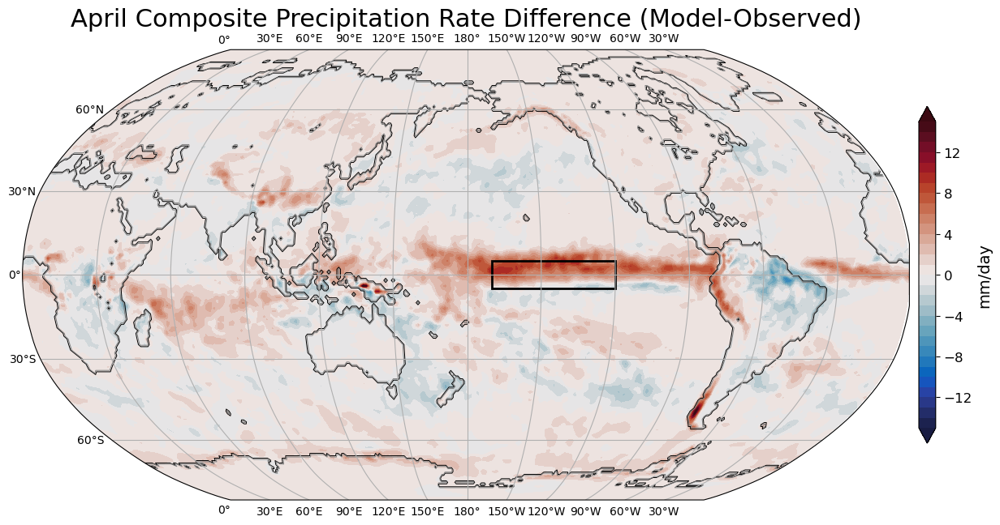

f
f


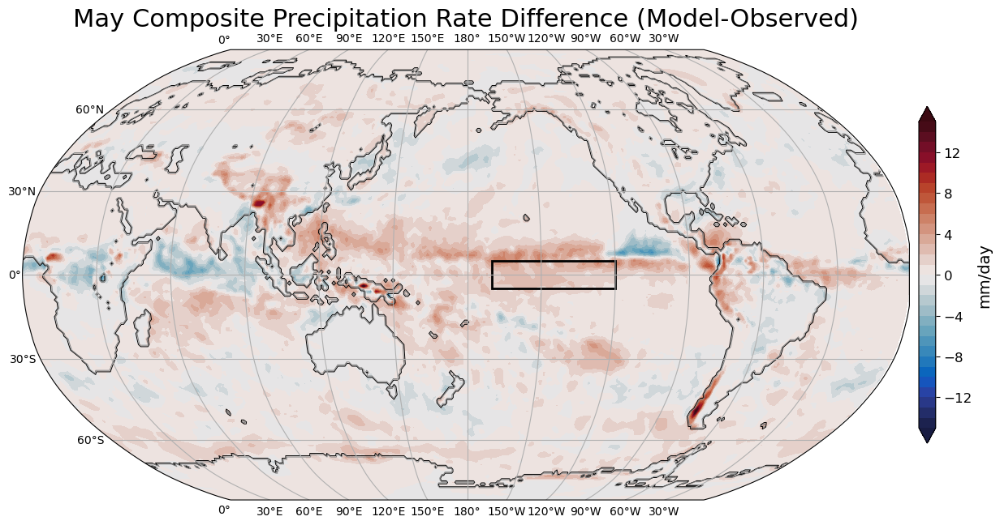

f
f


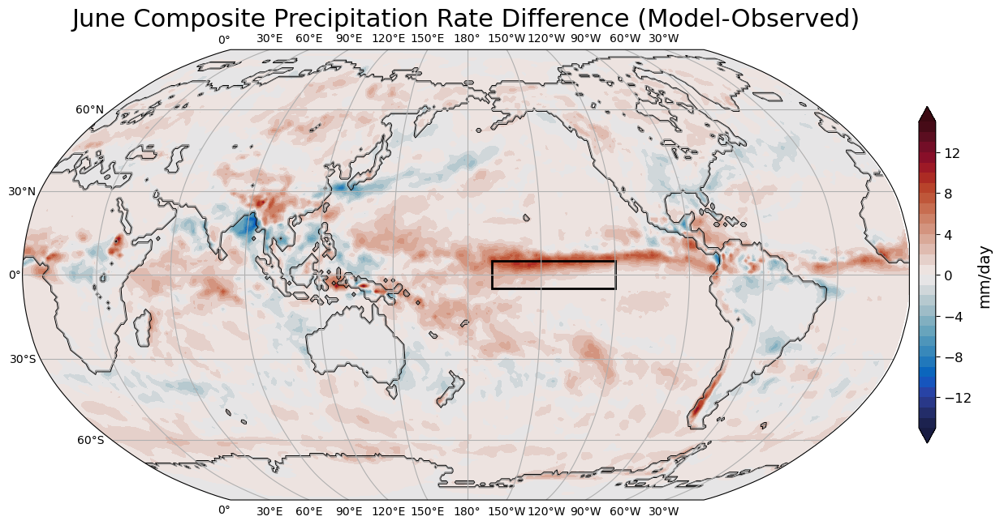

f
f


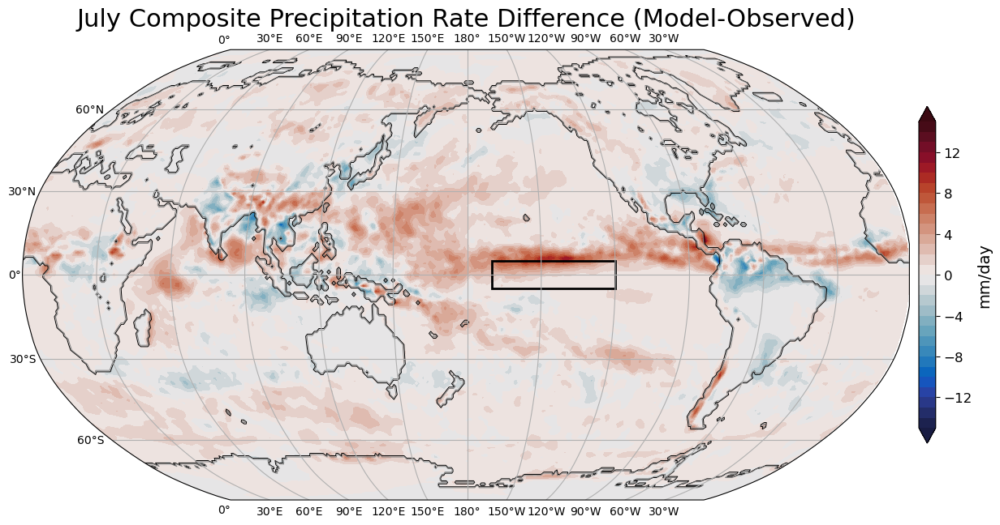

f
f


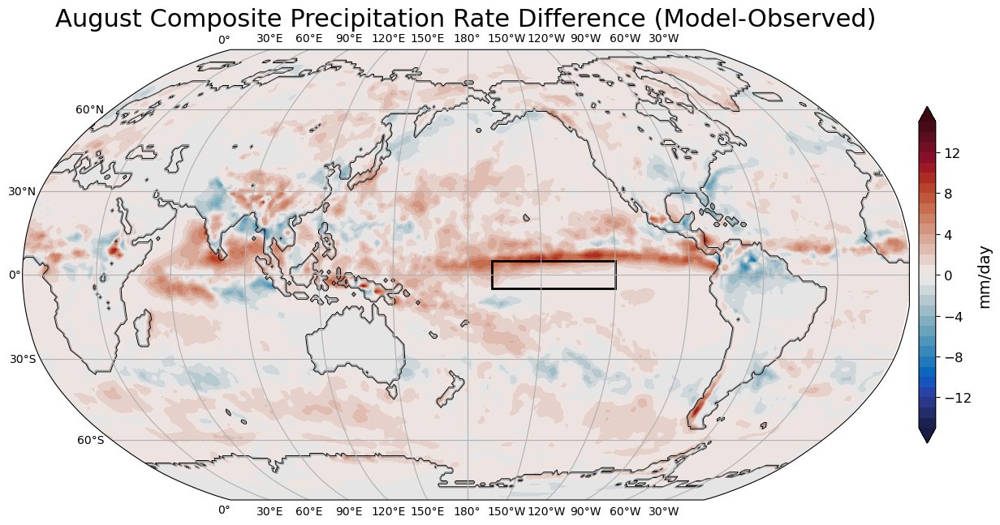

f
f


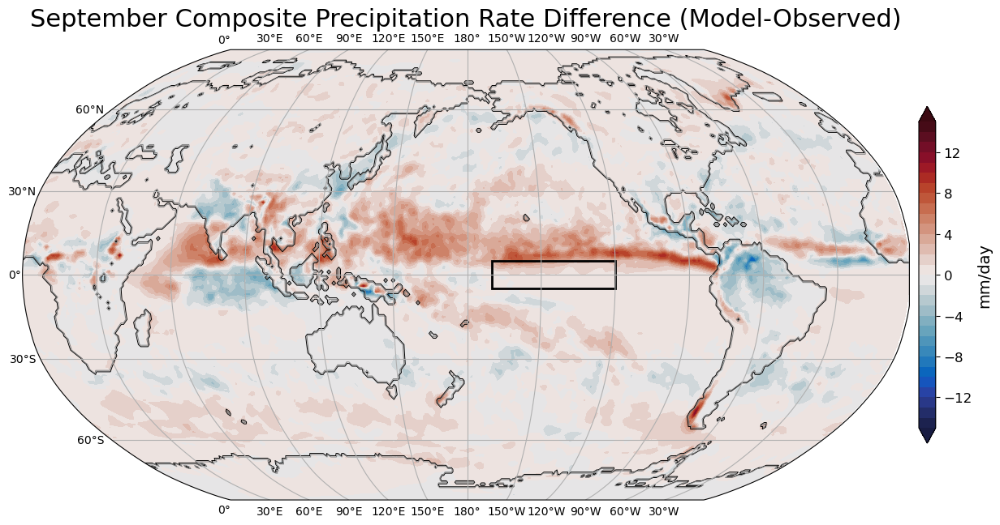

f
f


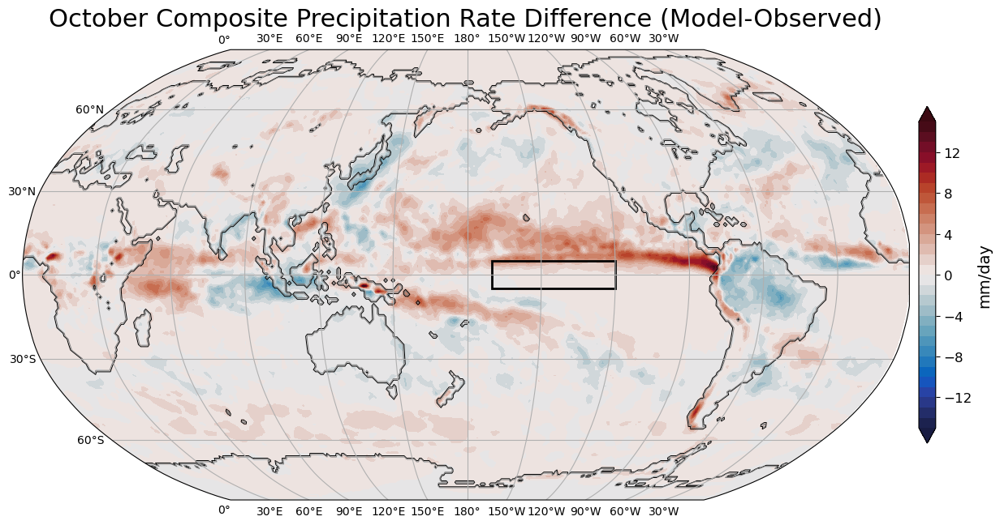

f
f


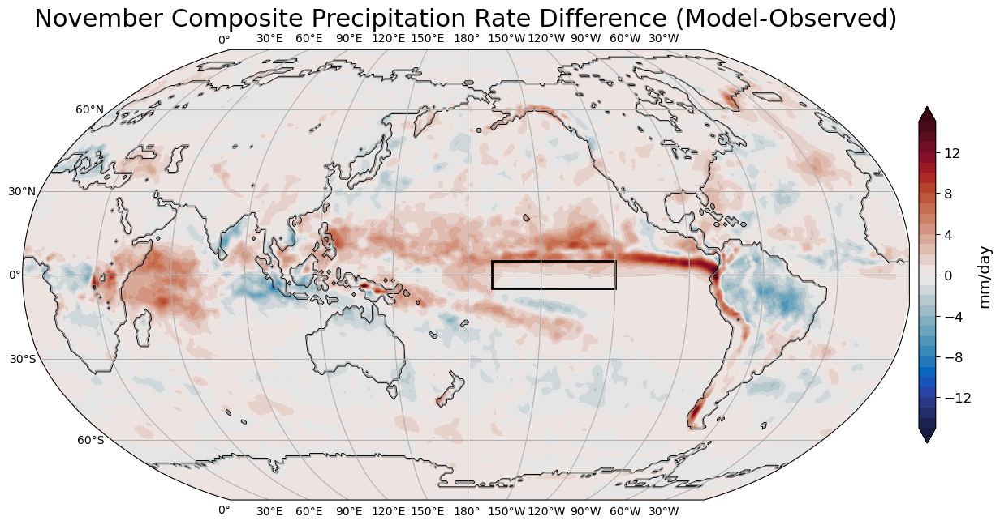

f
f


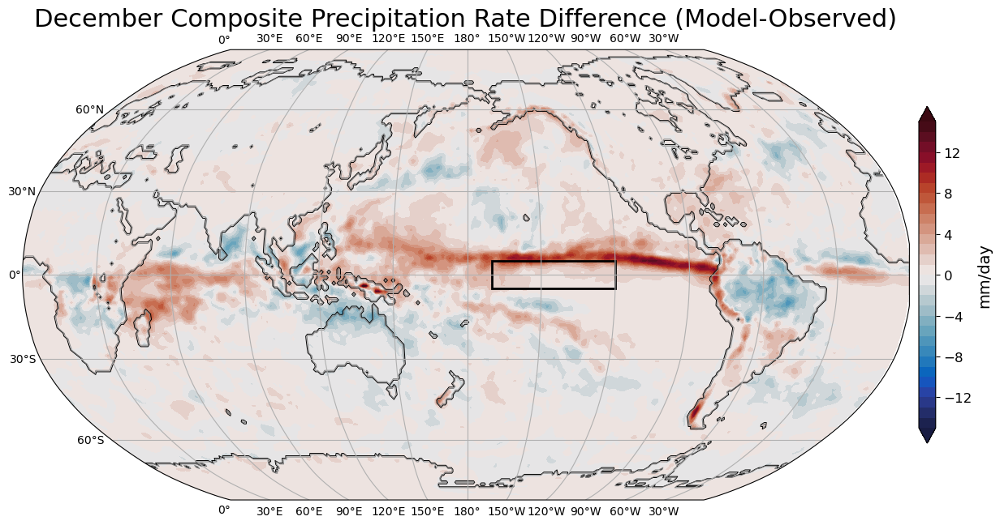

In [35]:
mo_diff=[Jdiff,Fdiff,Mardiff,Adiff,Maydiff,Jundiff,Juldiff,Augdiff,Sdiff,Odiff,Ndiff,Ddiff ]
months=['January', 'February','March','April','May','June','July','August','September','October','November','December',]
for i in range(0,12):
    
    diffs=mo_diff[i]
    
    res='110m'
    fig=plt.figure(figsize=(15,9))
    ax = plt.subplot(1, 1, 1, projection=ccrs.Robinson(central_longitude=180))
    #ax.set_extent([100, 290, -60, 60], crs=ccrs.PlateCarree())
    #ax.add_feature(cfeat.COASTLINE.with_scale(res))

    # Plot a contour-filled variable
    print('f')
    CG=ax.contourf(lon,lat,diffs,levels=np.arange(-15,16,1), cmap=cmo.cm.balance,extend='both', transform=ccrs.PlateCarree())
    CF=ax.contour(lon,lat,lsm2,levels=np.arange(0.25,1.5,0.5), cmap='gist_gray', transform=ccrs.PlateCarree(), linewidths=0.7)
    print('f')
    cbar=plt.colorbar(CG,fraction=0.05, pad=0.01,shrink=0.6)
    cbar.ax.tick_params(labelsize=12)
    cbar.ax.set_ylabel("mm/day", fontsize=14)
    ax.add_patch(mpatches.Rectangle(xy=[190, -5], width=50, height=10,
                                facecolor='none', edgecolor='k', linewidth=2,
                                transform=ccrs.PlateCarree()))
    ax.gridlines(draw_labels=True, xlocs=np.arange(-180,180,30))


    # Title
    title=ax.set_title(str(months[i])+ " Composite Precipitation Rate Difference (Model-Observed)",fontsize=22)
    picfile="Composite_PRATE_Differences/"+ str(months[i]) + ' Composite PRATE Difference' + '.png'
    plt.savefig(picfile, format='png')
    plt.show()

